In [ ]:
import os
import glob
import math
import subprocess
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# SET PARAMETERS
BUCKET = "saadwetlands-bucket"
PROVINCES = ["ON", "MB", "BC","BRBC"]
DOWNLOAD_LOCAL = True
LOCAL_TFRECORD_BASE = "/content/tfrecords"
IMG_H, IMG_W, IMG_C = 128, 128, 64
NUM_CLASSES = 15
BATCH_SIZE = 128
EPOCHS = 50
VAL_SPLIT = 0.10
AUTOTUNE = tf.data.AUTOTUNE
MODEL_SAVE_PATH = "/content/segmentation_model.keras"

In [ ]:
from google.colab import auth
auth.authenticate_user()

# DOWNLOAD FILES
all_files = []
for region in PROVINCES:
    gcs_dir = f"gs://{BUCKET}/output/patches1/{region}/"
    local_dir = os.path.join(LOCAL_TFRECORD_BASE, region)
    if DOWNLOAD_LOCAL:
        os.makedirs(local_dir, exist_ok=True)
        print(f"Downloading {region} TFRecords...")
        try:
            subprocess.run(["gsutil", "-m", "cp", os.path.join(gcs_dir, "*"), local_dir], check=True)
        except subprocess.CalledProcessError:
            print(f"Failed to download {region}, reading directly from GCS.")
            DOWNLOAD_LOCAL = False
    if DOWNLOAD_LOCAL:
        files = sorted(glob.glob(os.path.join(local_dir, "*")))
    else:
        files = tf.io.gfile.glob(os.path.join(gcs_dir, "*"))
    all_files.extend(files)

if len(all_files) == 0:
    raise RuntimeError("No TFRecords found.")

compression_type = "GZIP" if any(f.endswith(".gz") or f.endswith(".tfrecord.gz") for f in all_files) else None
print(f"Found {len(all_files)} TFRecords. Compression: {compression_type}")


Found 254 TFRecords. Compression: None


In [ ]:
import tensorflow as tf
import numpy as np
import math
import matplotlib.pyplot as plt
from tensorflow.keras import layers, Model

# PARSE TENSORFLOW
def _parse_fn_no_reshape(example_proto):
    feature_desc = {
        'embedding': tf.io.FixedLenFeature([], tf.string),
        'label': tf.io.FixedLenFeature([], tf.string),
        'height': tf.io.FixedLenFeature([], tf.int64),
        'width': tf.io.FixedLenFeature([], tf.int64),
        'bands': tf.io.FixedLenFeature([], tf.int64),
    }
    parsed = tf.io.parse_single_example(example_proto, feature_desc)
    h = parsed['height']
    w = parsed['width']
    c = parsed['bands']

    emb = tf.io.decode_raw(parsed['embedding'], tf.float32)
    lab = tf.io.decode_raw(parsed['label'], tf.int32)

    return emb, lab, h, w, c

def filter_fn(emb, lab, h, w, c):
    return tf.logical_and(tf.logical_and(h == IMG_H, w == IMG_W), c == IMG_C)

def reshape_fn(emb, lab, h, w, c):
    emb = tf.reshape(emb, [IMG_H, IMG_W, IMG_C])
    lab = tf.reshape(lab, [IMG_H, IMG_W])
    return emb, lab

base_ds = tf.data.TFRecordDataset(all_files, compression_type=compression_type) \
            if compression_type else tf.data.TFRecordDataset(all_files)

base_ds = base_ds.map(_parse_fn_no_reshape, num_parallel_calls=AUTOTUNE)
base_ds = base_ds.filter(filter_fn)
base_ds = base_ds.map(reshape_fn, num_parallel_calls=AUTOTUNE)

dataset = base_ds.shuffle(buffer_size=2048, seed=42)
total_count = sum(1 for _ in dataset)
val_count = max(1, int(total_count * VAL_SPLIT))
train_count = total_count - val_count

train_ds = dataset.skip(val_count).batch(BATCH_SIZE).prefetch(AUTOTUNE)
val_ds = dataset.take(val_count).batch(BATCH_SIZE).prefetch(AUTOTUNE)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │     36,928 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 64, 64,    │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_23[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 32, 32,    │    590,080 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_24[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_6[

 Total params: 31,438,543 (119.93 MB)

 Trainable params: 31,426,767 (119.88 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/50
   1688/Unknown 100s 42ms/step - accuracy: 0.5957 - loss: 1.1613 - mIoU: 0.2181

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1688/1688 ━━━━━━━━━━━━━━━━━━━━ 116s 51ms/step - accuracy: 0.5958 - loss: 1.1612 - mIoU: 0.2182 - val_accuracy: 0.5692 - val_loss: 1.0238 - val_mIoU: 0.1637 - learning_rate: 1.0000e-04
Epoch 2/50
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 73s 39ms/step - accuracy: 0.6426 - loss: 1.0271 - mIoU: 0.2751 - val_accuracy: 0.5620 - val_loss: 1.0304 - val_mIoU: 0.1695 - learning_rate: 1.0000e-04
Epoch 3/50
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 75s 40ms/step - accuracy: 0.6678 - loss: 0.9642 - mIoU: 0.3114 - val_accuracy: 0.6300 - val_loss: 0.9454 - val_mIoU: 0.1896 - learning_rate: 1.0000e-04
Epoch 4/50
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 75s 40ms/step - accuracy: 0.6847 - loss: 0.9240 - mIoU: 0.3327 - val_accuracy: 0.6550 - val_loss: 0.9008 - val_mIoU: 0.2318 - learning_rate: 1.0000e-04
Epoch 5/50
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 73s 39ms/step - accuracy: 0.6915 - loss: 0.9036 - mIoU: 0.3513 - val_accuracy: 0.6546 - val_loss: 0.9173 - val_mIoU: 0.2361 - learning_rate: 1.0000e-04
Epoch 6/50
1688/1688 ━━━━━━━━━━━━━━━━━━━

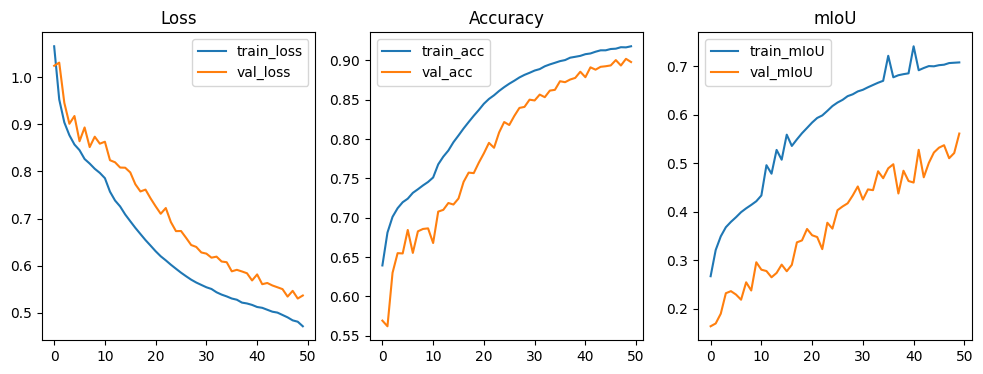

In [ ]:
class MeanIoUPerPixel(tf.keras.metrics.Metric):
    def __init__(self, num_classes, name="mIoU", **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.conf_matrix = self.add_weight(shape=(num_classes,num_classes),
                                           initializer='zeros', dtype=tf.float32)
    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1, output_type=tf.int32)
        y_true = tf.cast(y_true, tf.int32)
        y_true_f = tf.reshape(y_true, [-1])
        y_pred_f = tf.reshape(y_pred, [-1])
        cm = tf.math.confusion_matrix(y_true_f, y_pred_f, num_classes=self.num_classes, dtype=tf.float32)
        self.conf_matrix.assign_add(cm)
    def result(self):
        intersection = tf.linalg.diag_part(self.conf_matrix)
        union = tf.reduce_sum(self.conf_matrix, axis=1) + tf.reduce_sum(self.conf_matrix, axis=0) - intersection
        iou = intersection / (union + 1e-7)
        valid = tf.where(union>0,1.0,0.0)
        return tf.reduce_sum(iou*valid)/(tf.reduce_sum(valid)+1e-7)
    def reset_states(self):
        tf.keras.backend.set_value(self.conf_matrix, np.zeros((self.num_classes,self.num_classes),dtype=np.float32))

def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), NUM_CLASSES)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true_one_hot * y_pred, axis=[1,2])
    union = tf.reduce_sum(y_true_one_hot + y_pred, axis=[1,2])
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - tf.reduce_mean(dice)

def ce_loss(y_true, y_pred):
    y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), NUM_CLASSES, dtype=tf.float32)
    return tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_true_one_hot, y_pred))

def combo_loss(y_true, y_pred, alpha=0.5):
    return alpha * ce_loss(y_true, y_pred) + (1 - alpha) * dice_loss(y_true, y_pred)

def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    return x

def up_block(x, skip, filters):
    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet(input_shape=(IMG_H, IMG_W, IMG_C), num_classes=NUM_CLASSES):
    inputs = layers.Input(shape=input_shape)
    # Encoder
    c1 = conv_block(inputs, 64)
    p1 = layers.MaxPool2D()(c1)
    c2 = conv_block(p1, 128)
    p2 = layers.MaxPool2D()(c2)
    c3 = conv_block(p2, 256)
    p3 = layers.MaxPool2D()(c3)
    c4 = conv_block(p3, 512)
    p4 = layers.MaxPool2D()(c4)
    # Bottleneck
    b = conv_block(p4, 1024)
    # Decoder
    u1 = up_block(b, c4, 512)
    u2 = up_block(u1, c3, 256)
    u3 = up_block(u2, c2, 128)
    u4 = up_block(u3, c1, 64)
    outputs = layers.Conv2D(num_classes, 1, activation='softmax')(u4)
    return Model(inputs, outputs)

model = build_unet()
model.summary()


miou_metric = MeanIoUPerPixel(NUM_CLASSES)
optimizer = tf.keras.optimizers.Adam(1e-4)
model.compile(optimizer=optimizer, loss=combo_loss, metrics=['accuracy', miou_metric])

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(MODEL_SAVE_PATH, save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
]

history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend(); plt.title('Loss')

plt.subplot(1,3,2)
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.legend(); plt.title('Accuracy')

plt.subplot(1,3,3)
plt.plot(history.history['mIoU'], label='train_mIoU')
plt.plot(history.history['val_mIoU'], label='val_mIoU')
plt.legend(); plt.title('mIoU')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


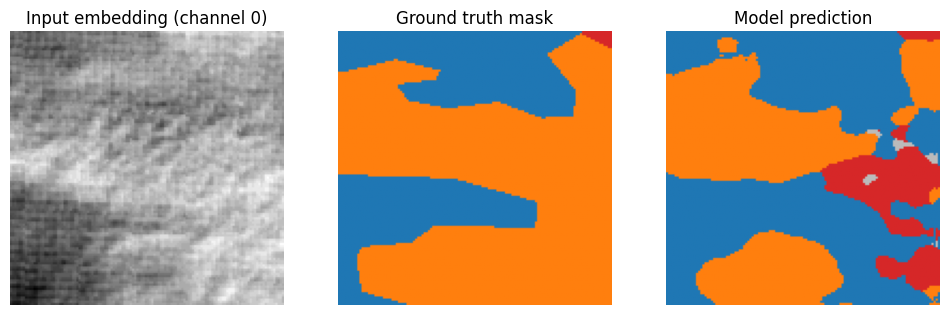

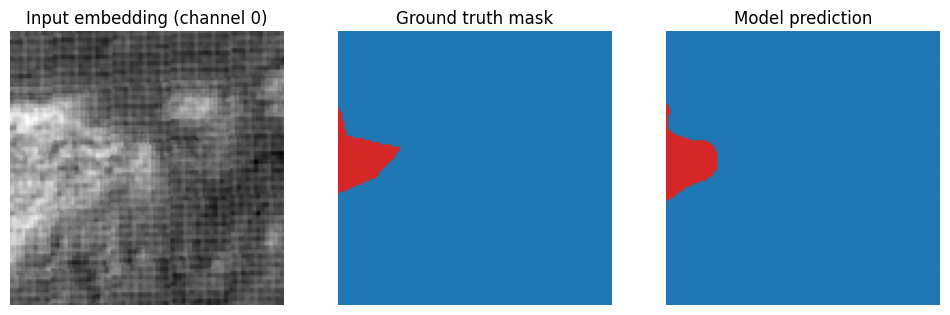

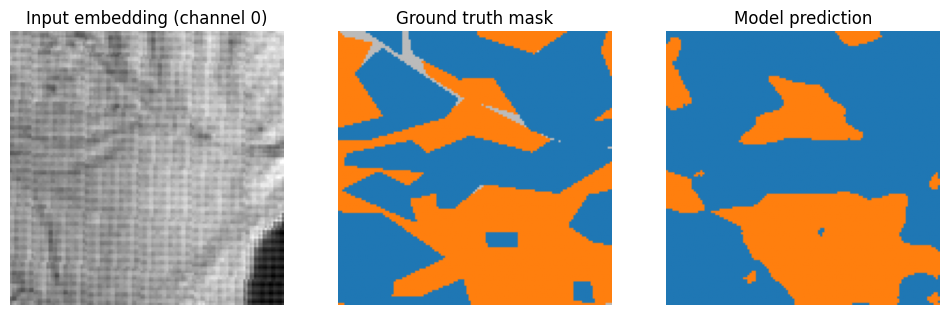

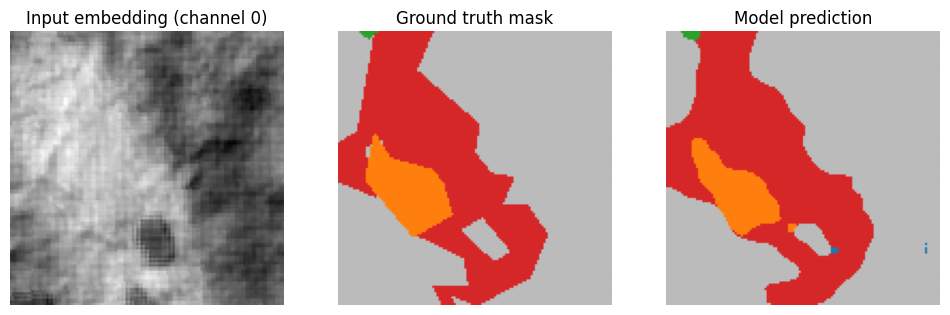

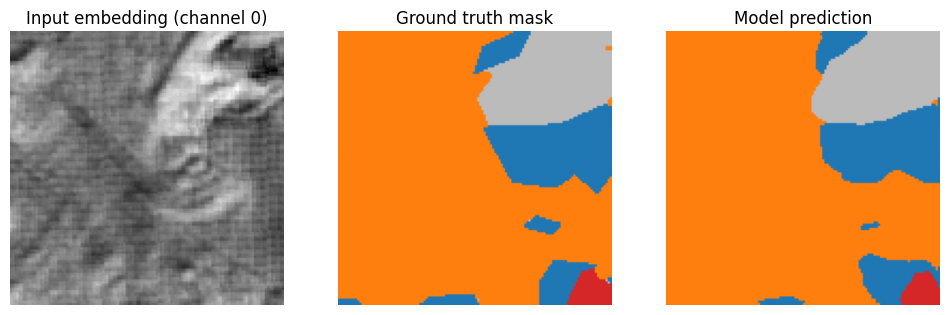

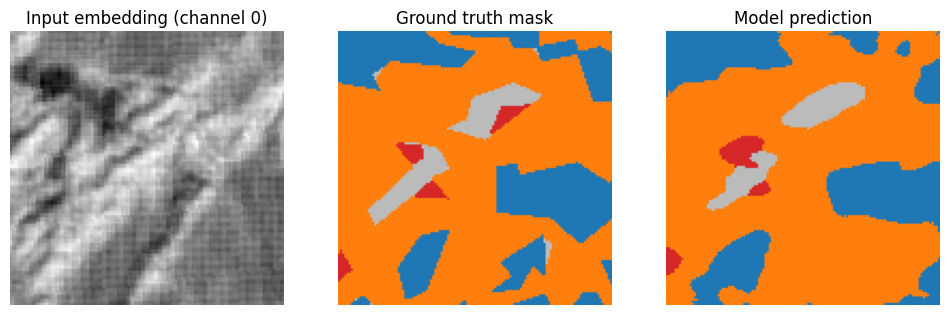

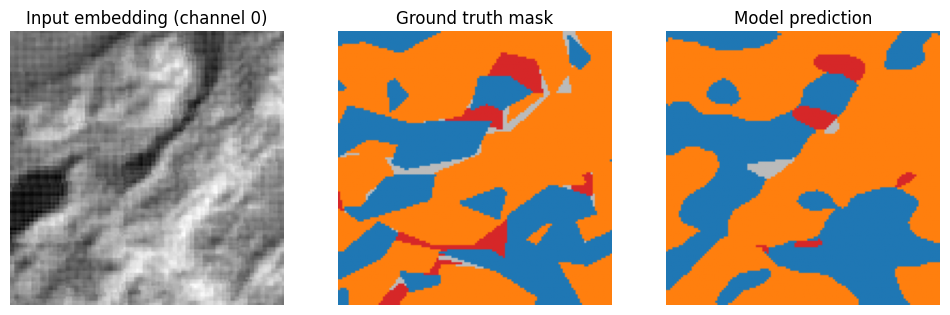

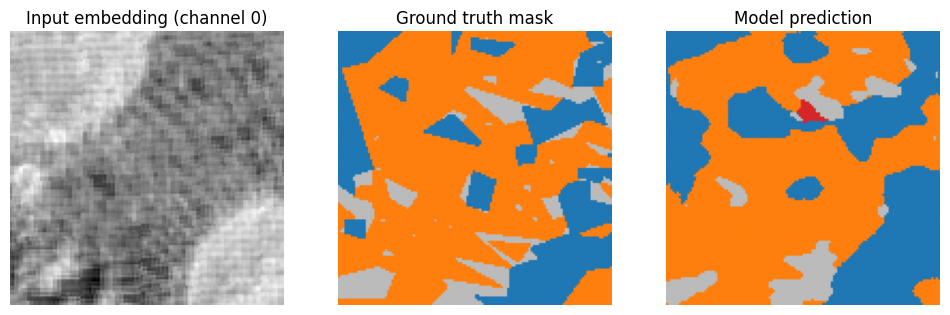

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


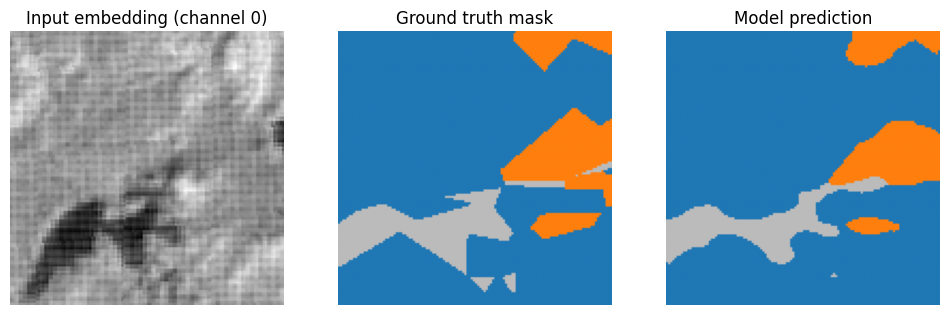

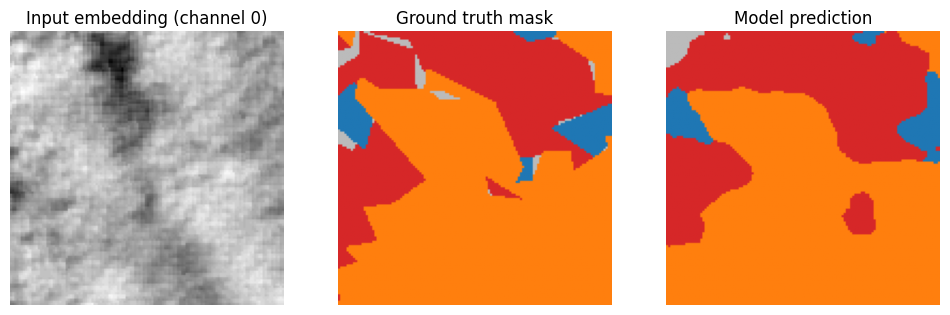

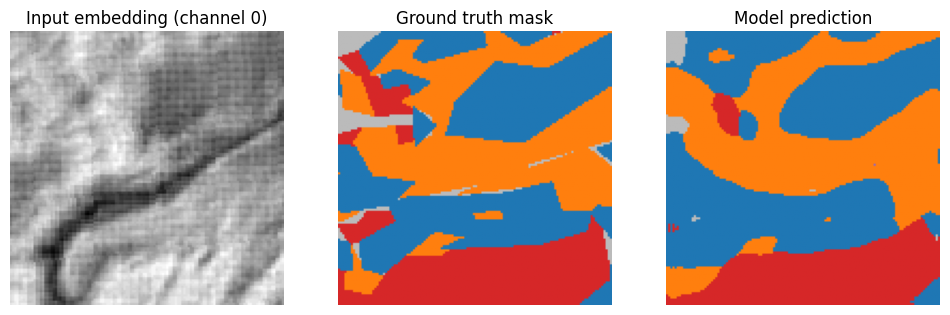

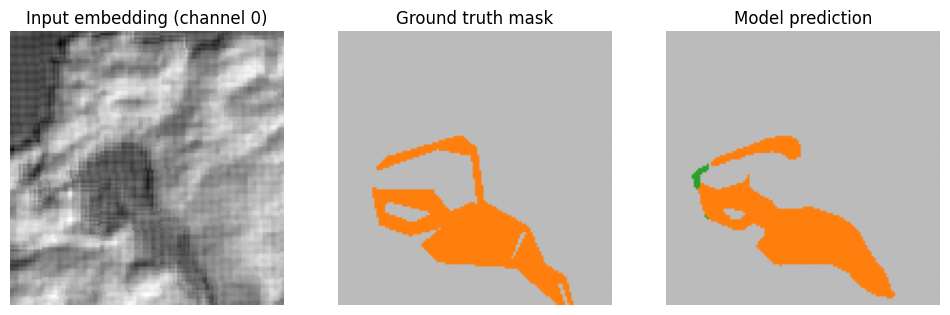

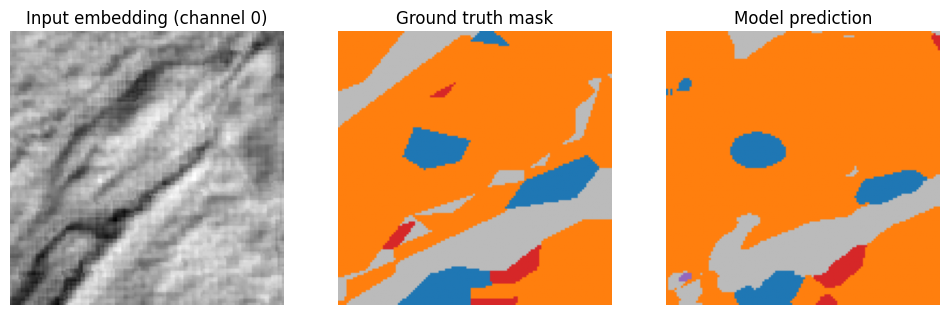

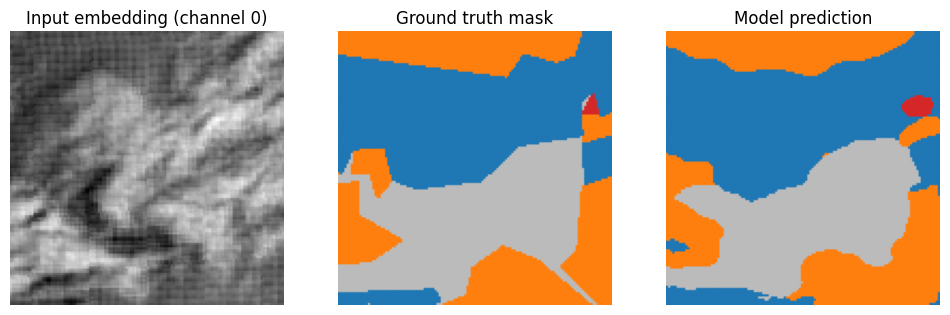

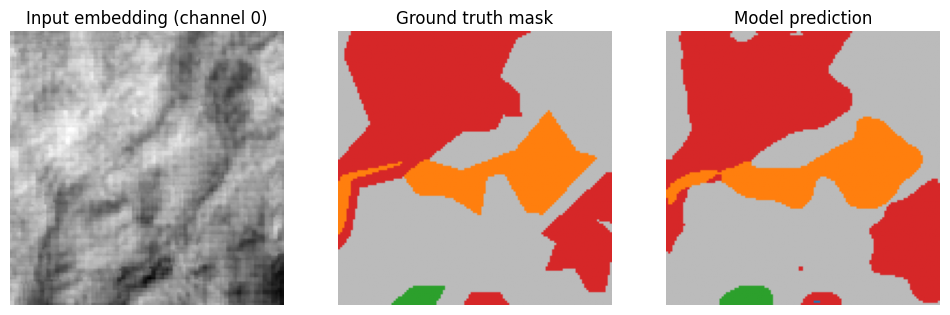

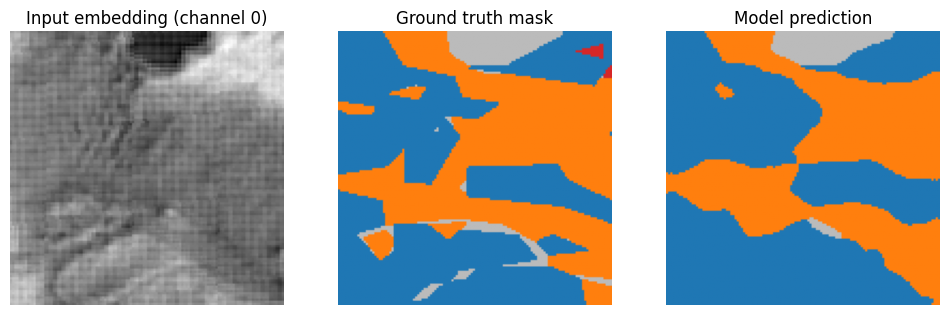

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


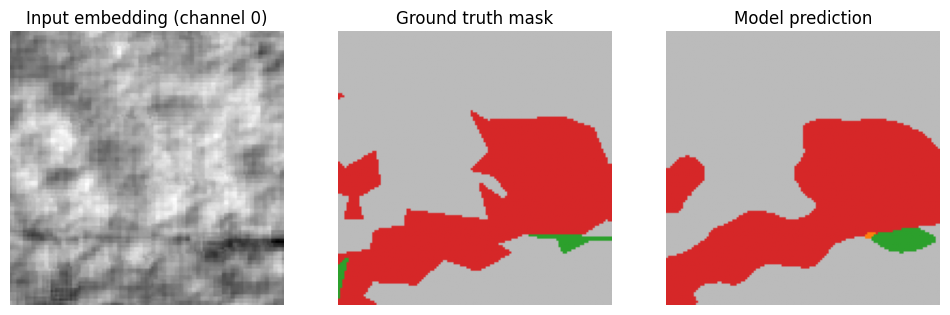

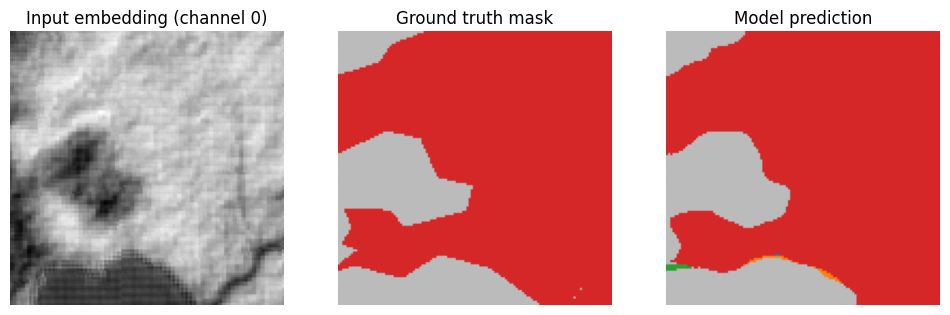

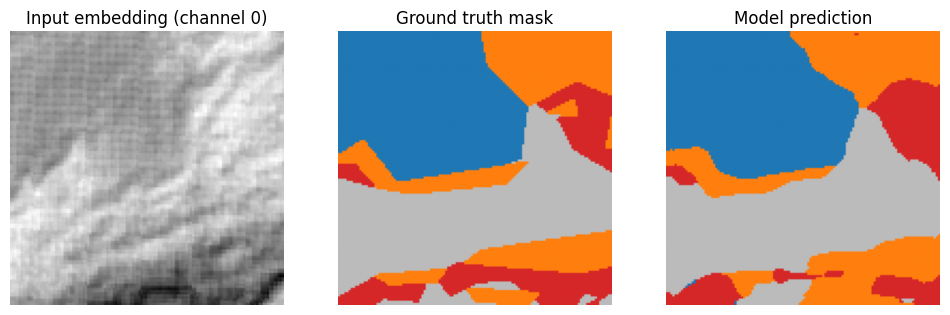

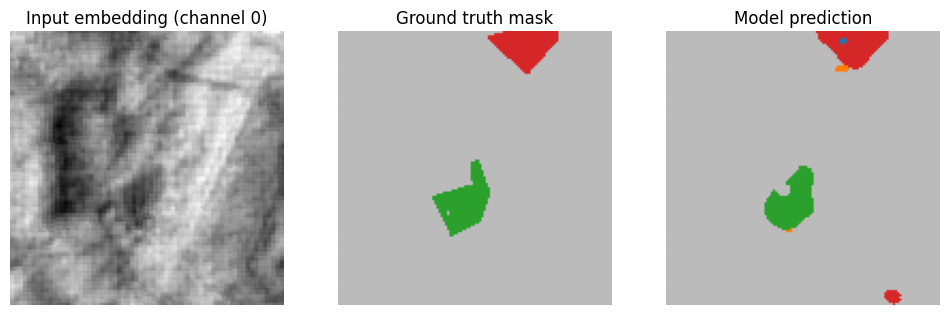

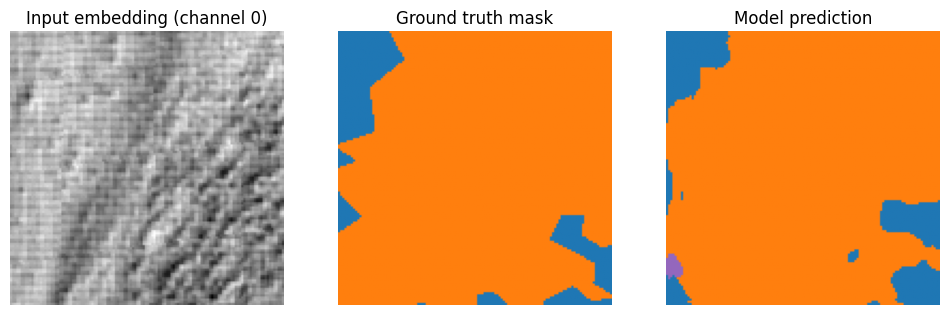

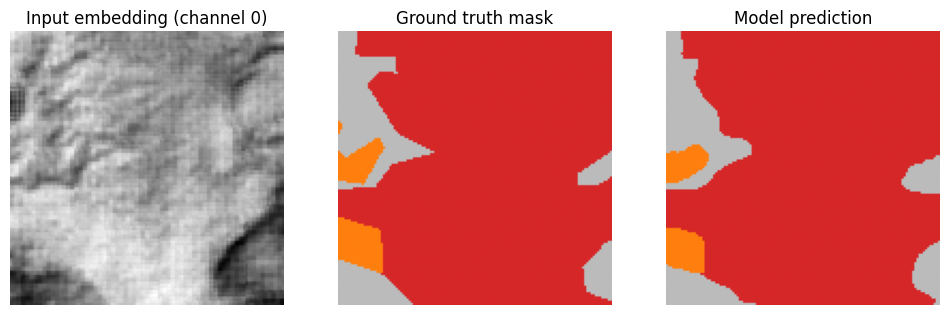

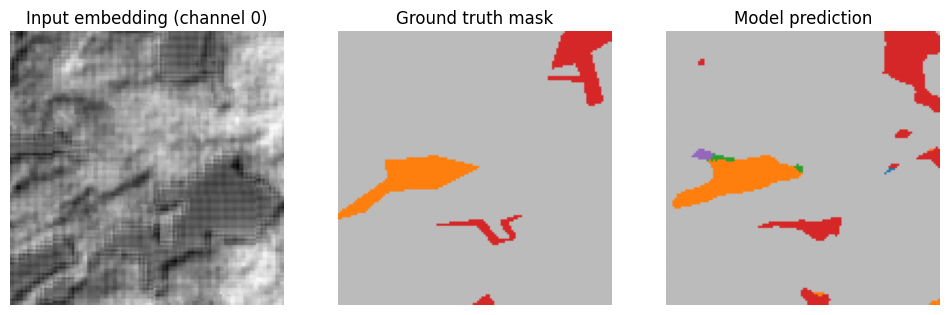

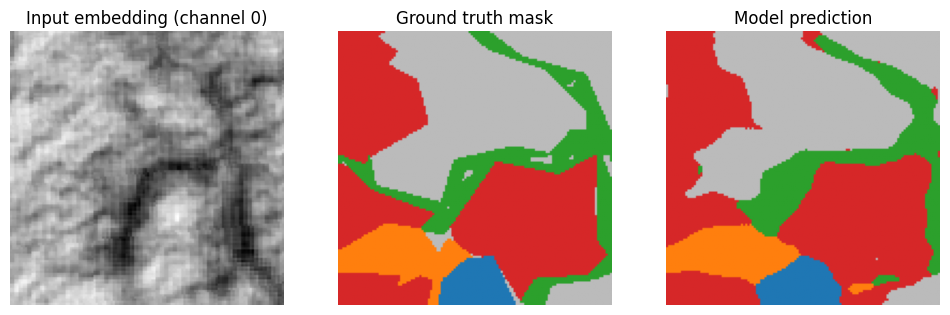

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


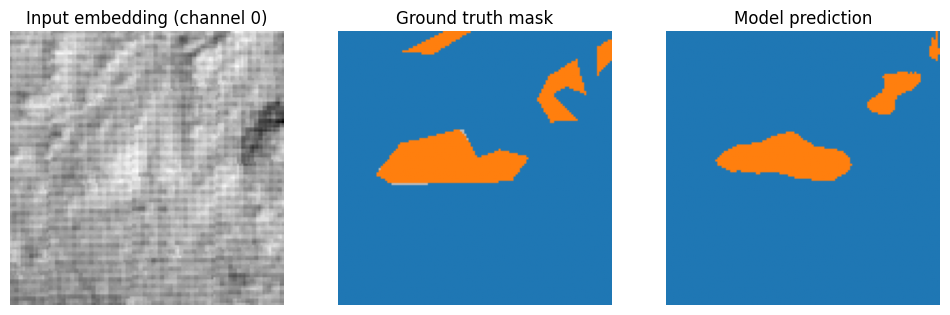

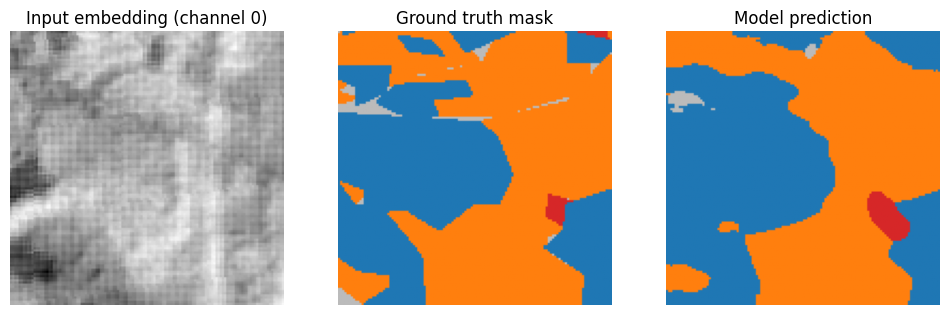

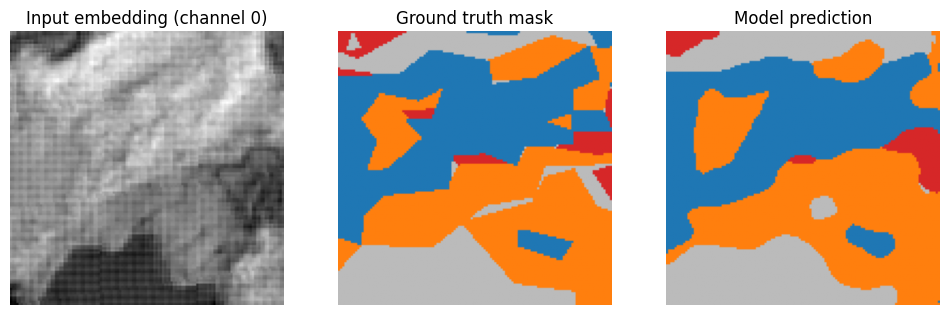

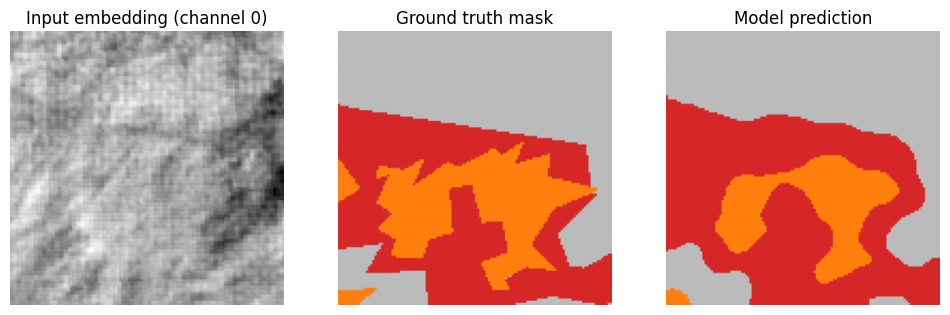

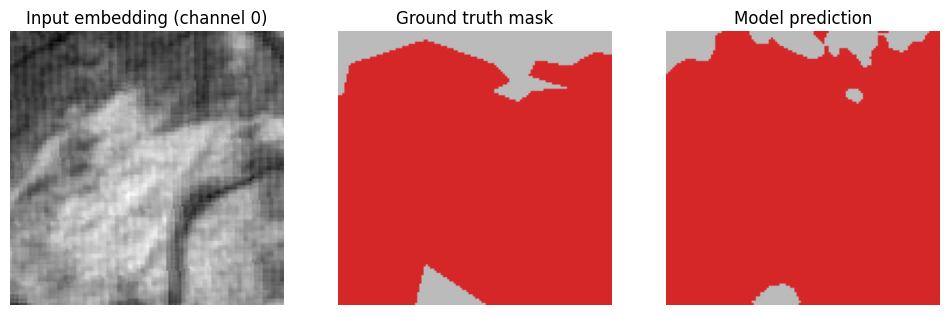

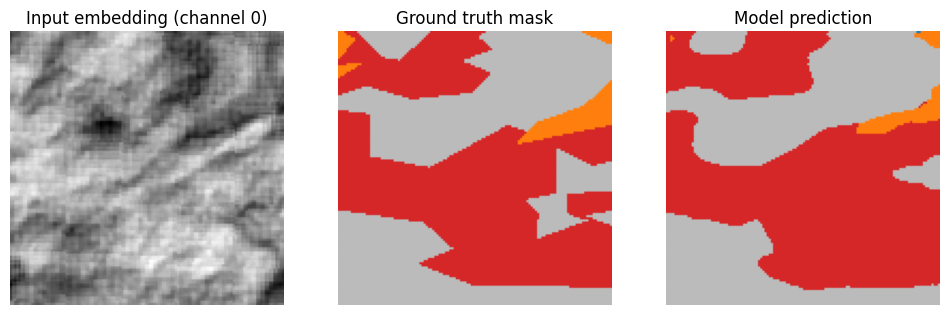

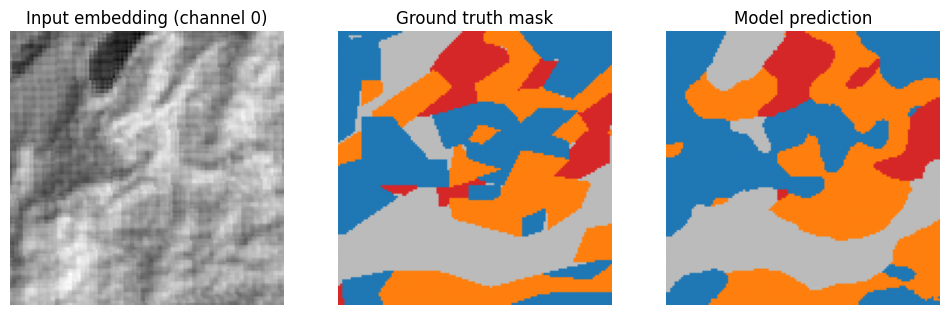

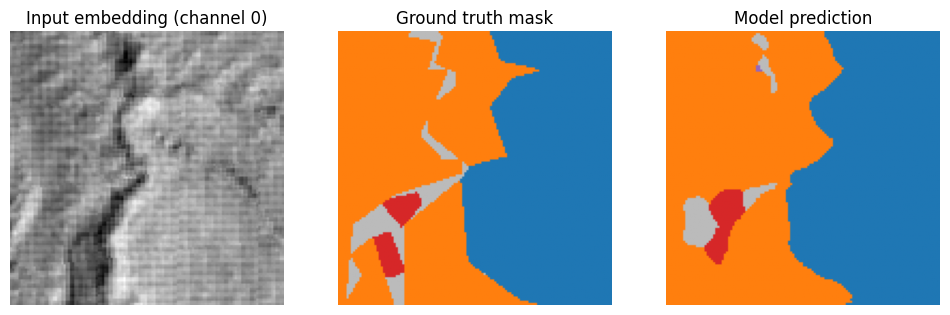

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


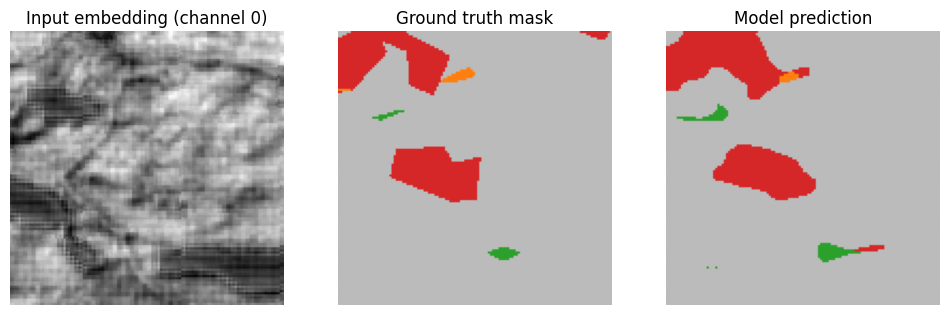

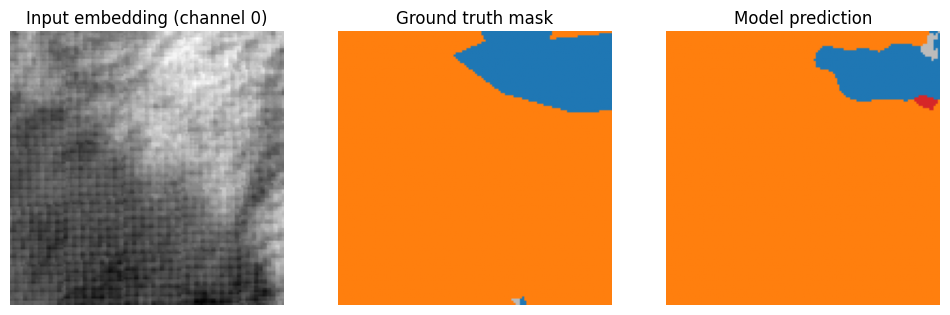

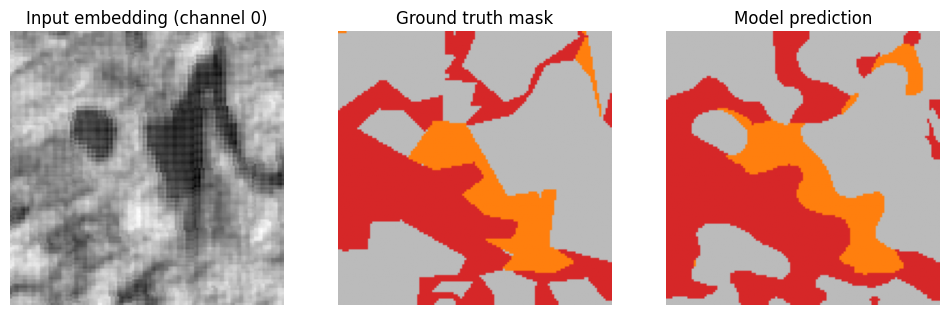

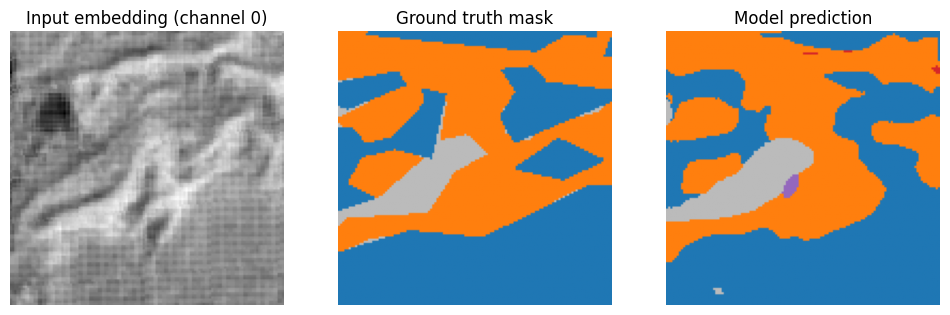

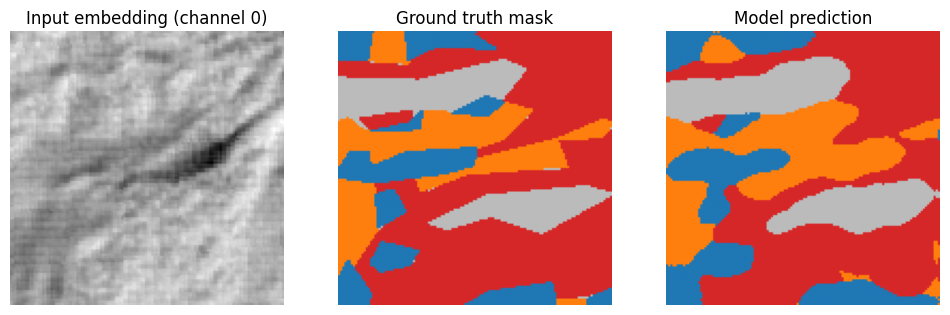

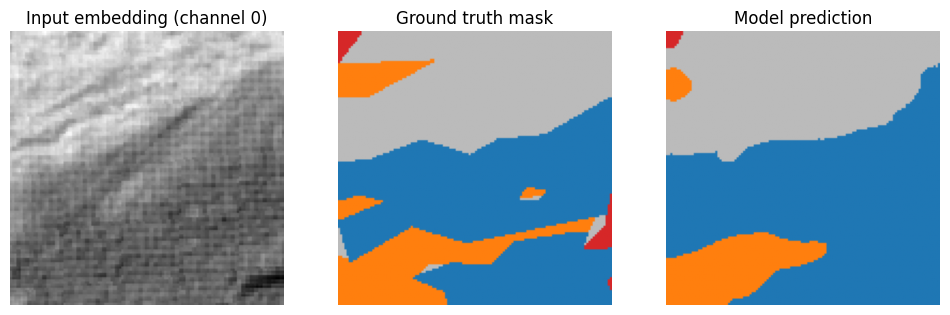

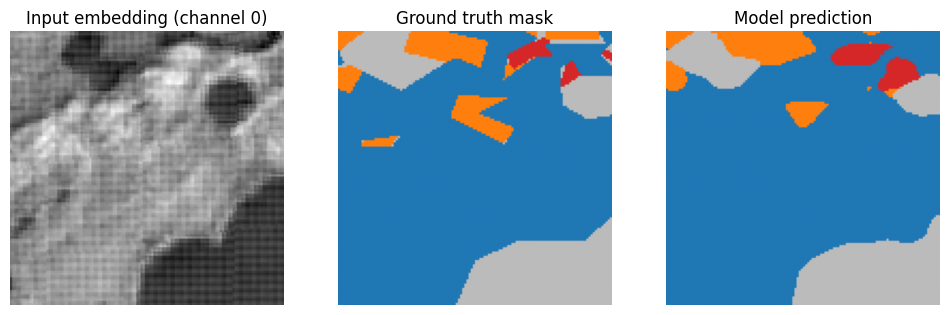

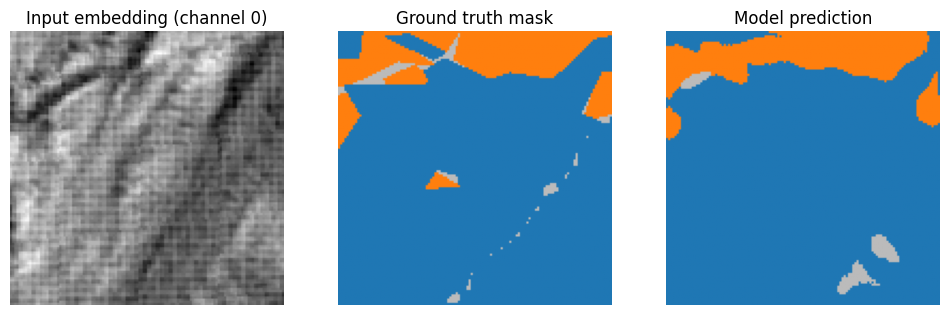

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


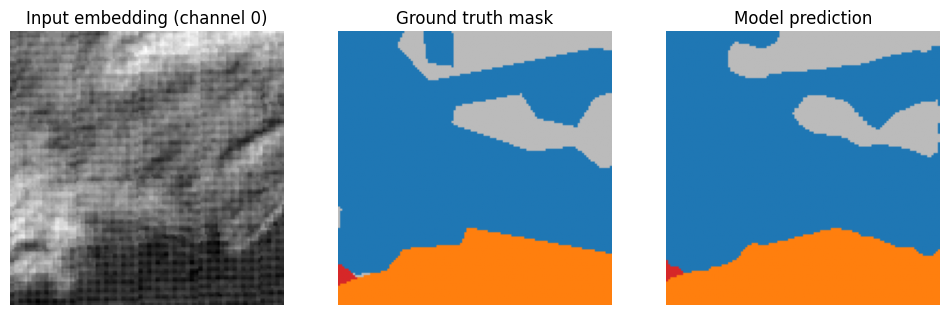

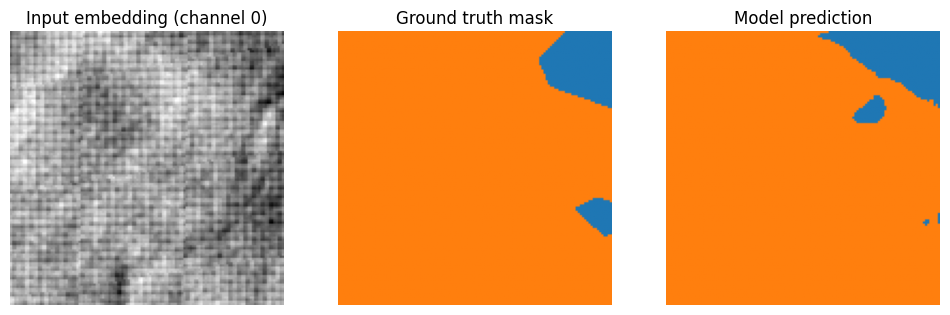

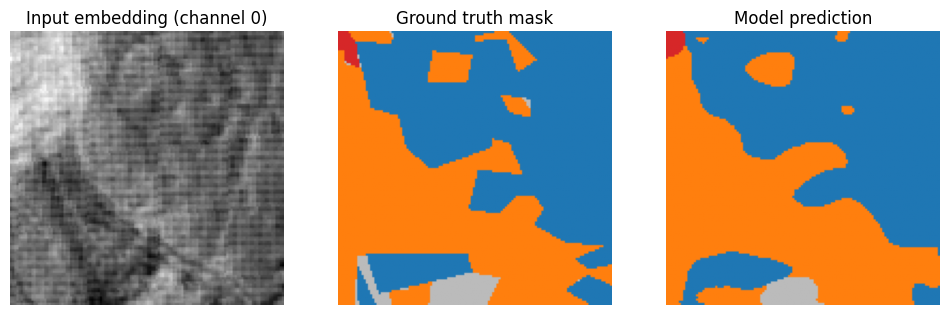

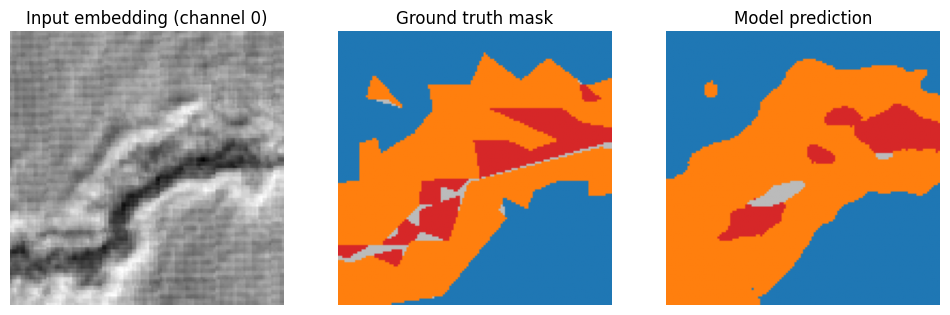

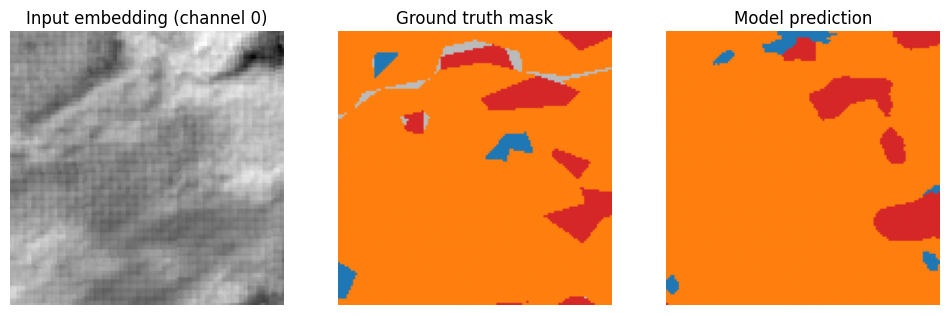

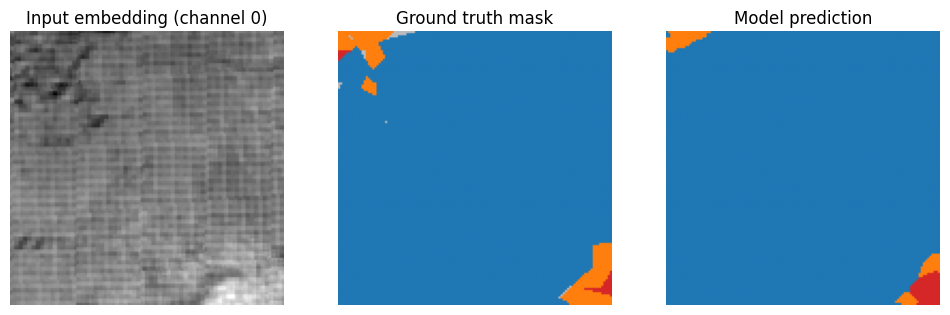

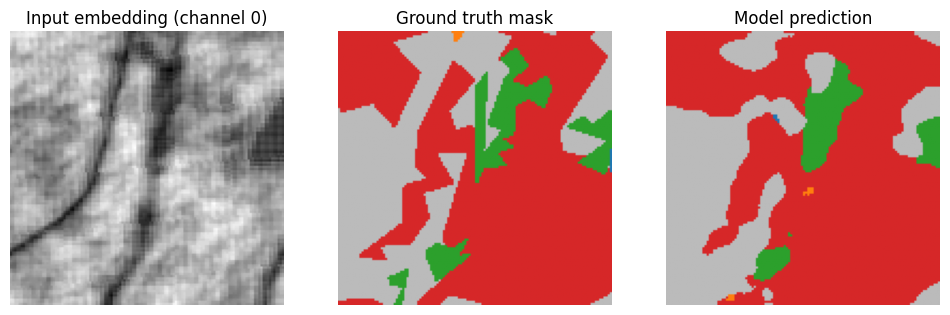

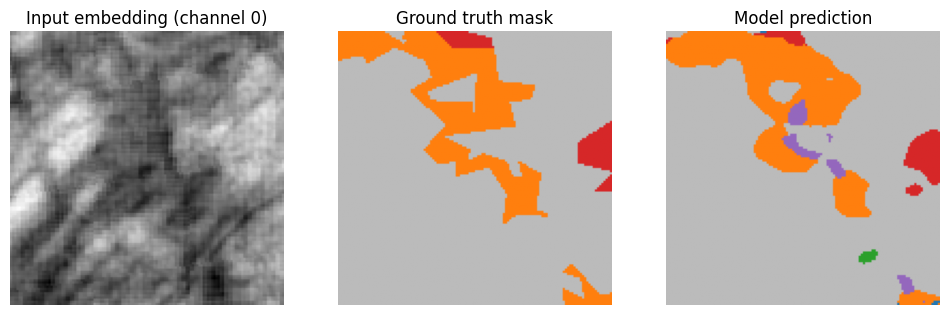

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


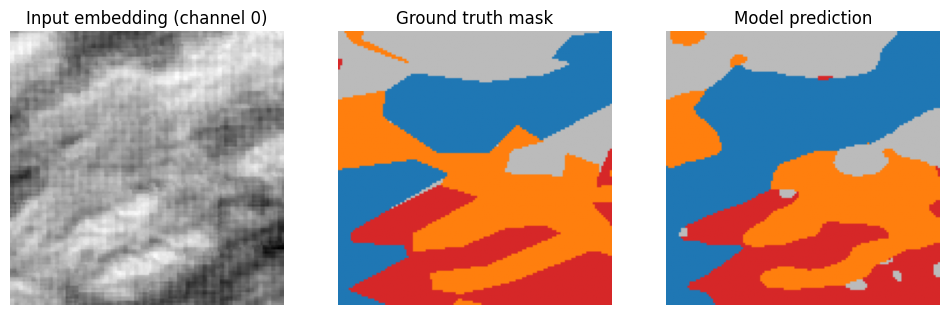

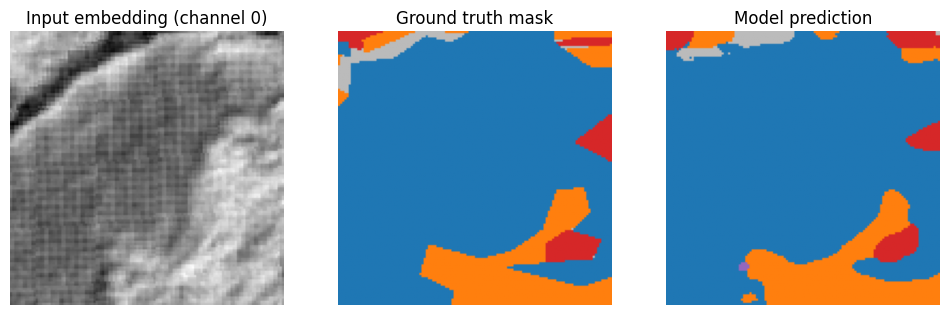

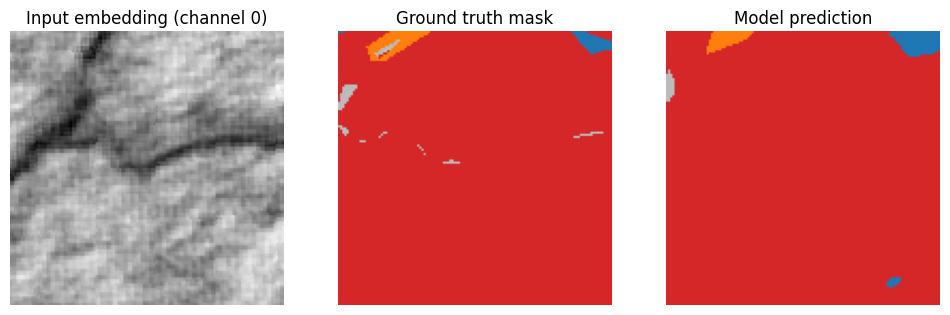

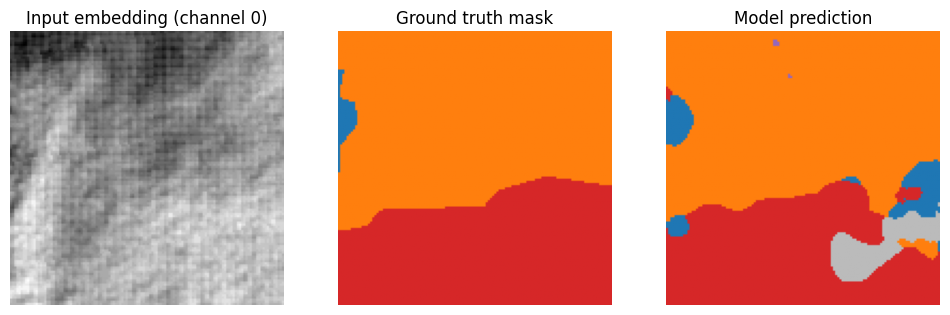

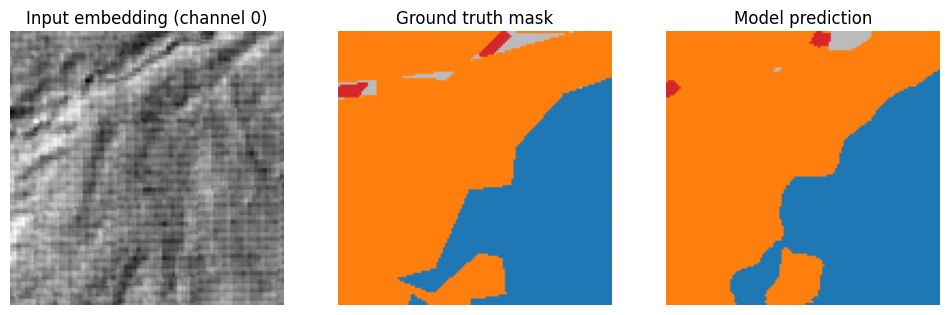

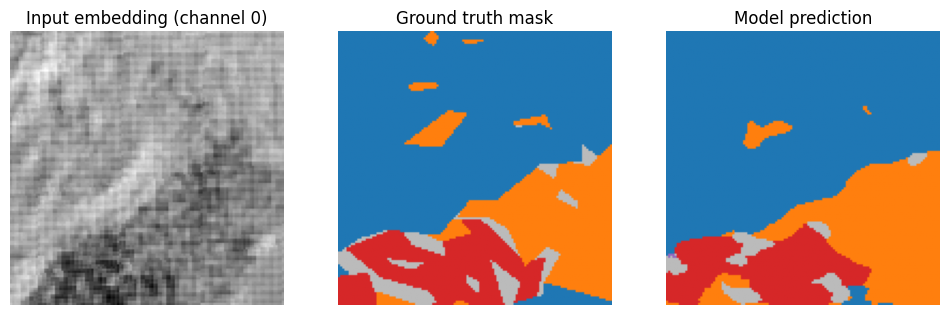

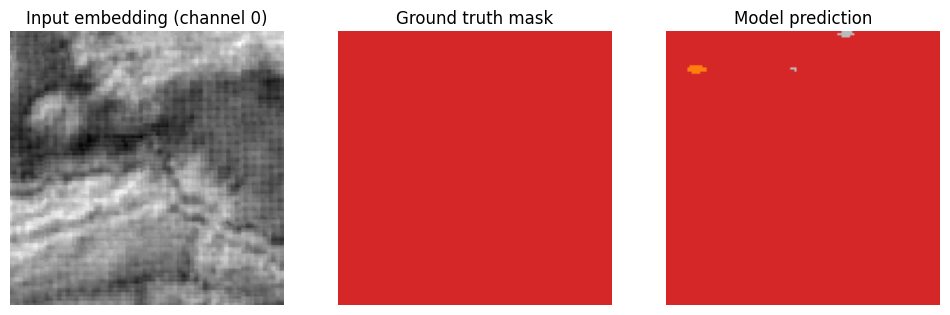

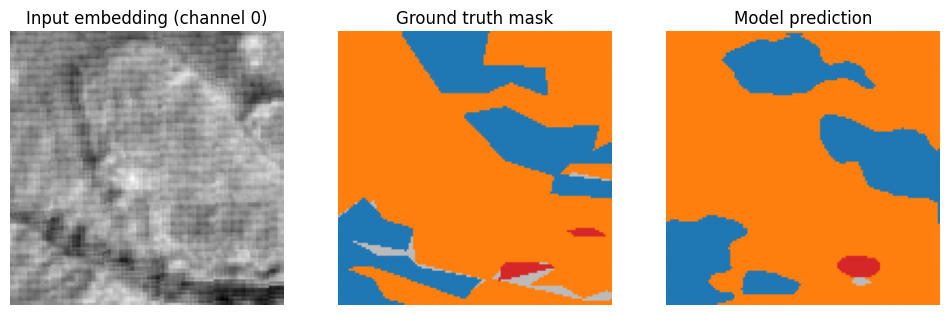

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


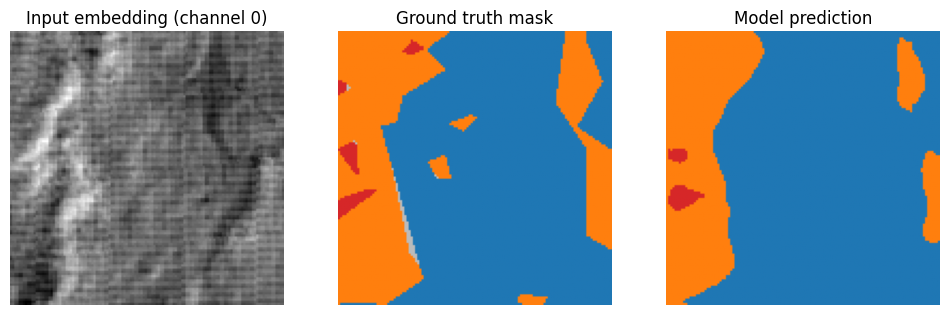

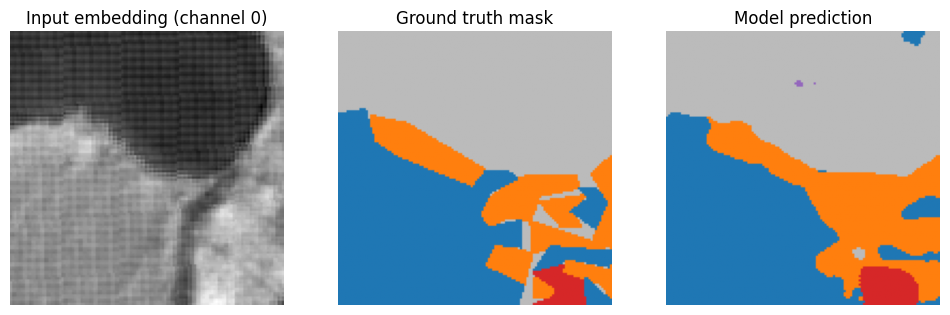

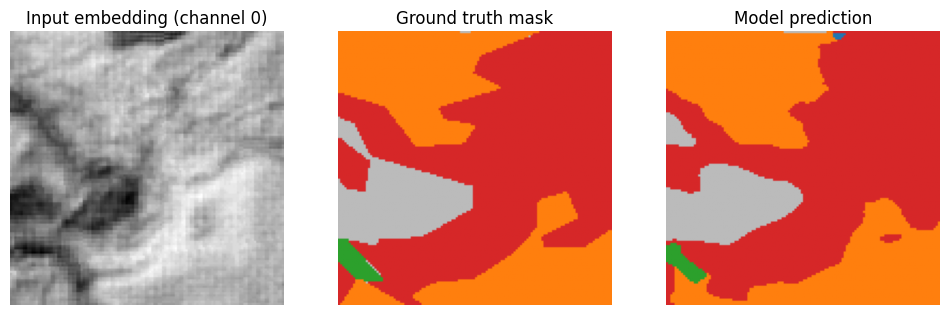

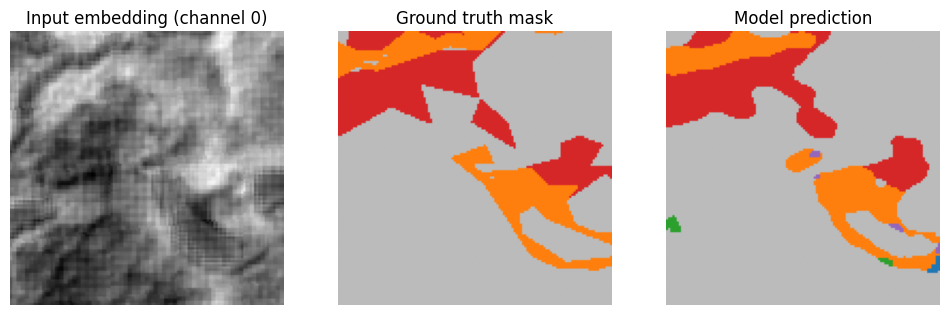

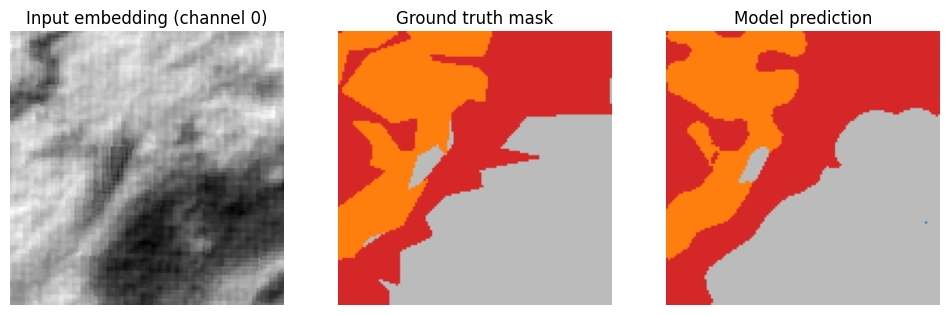

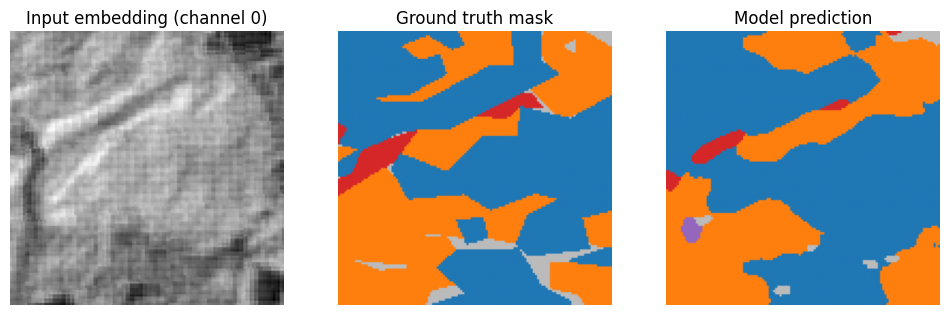

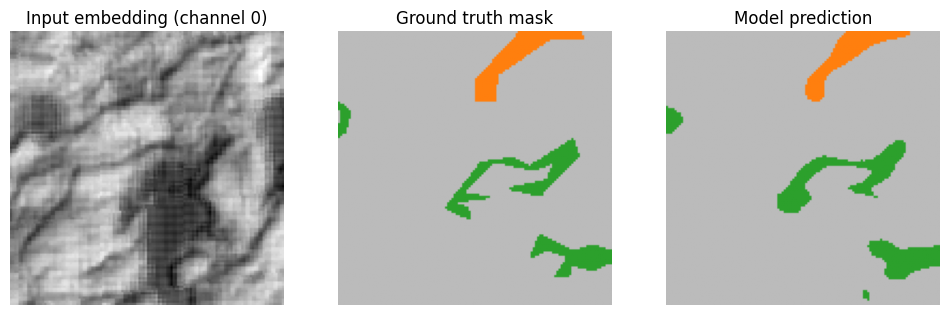

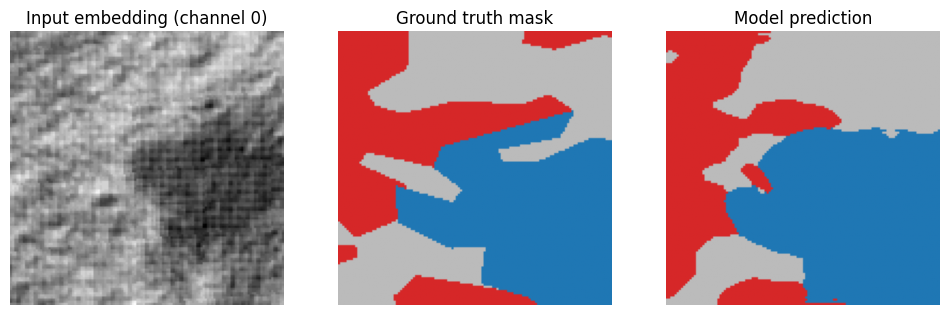

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


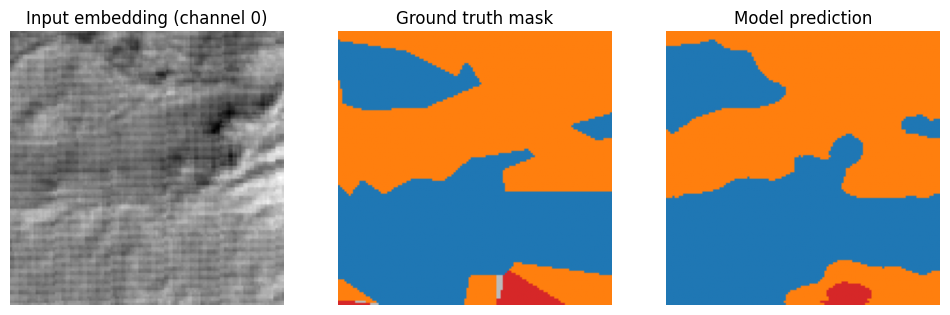

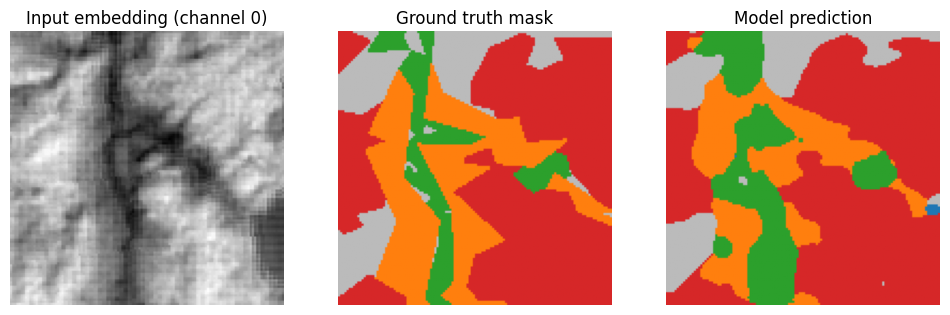

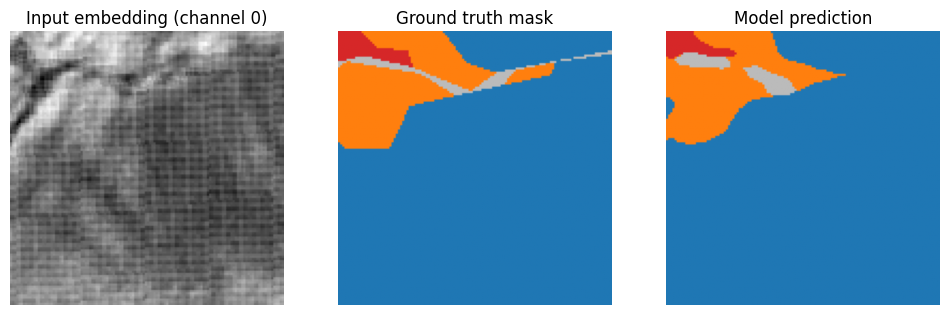

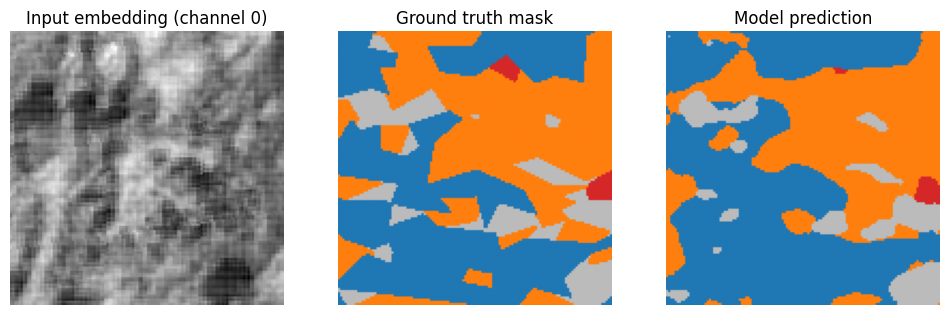

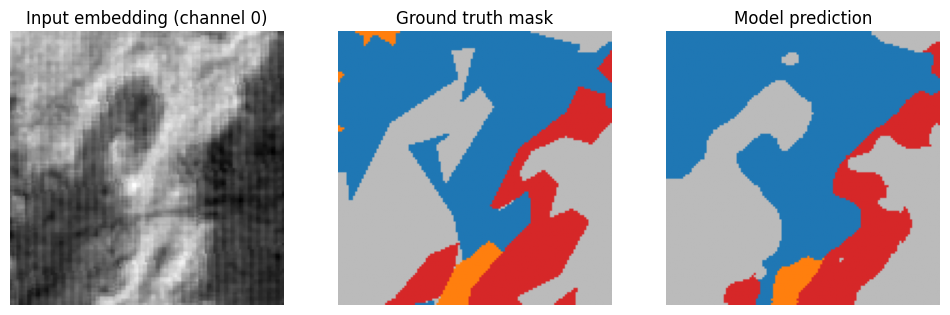

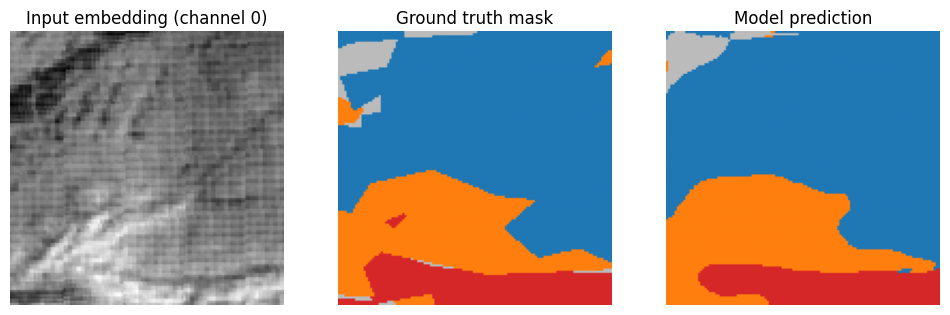

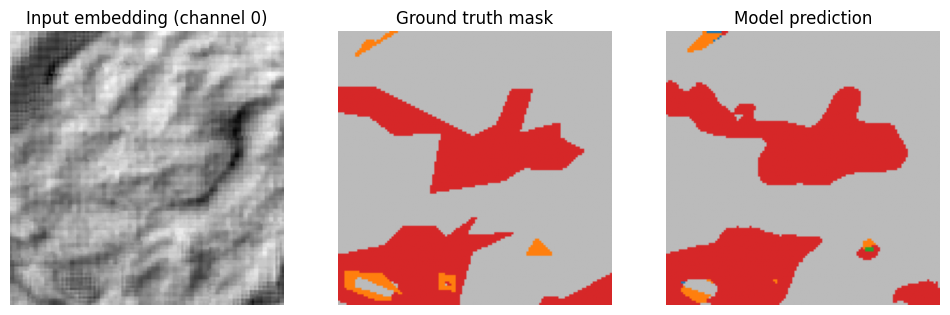

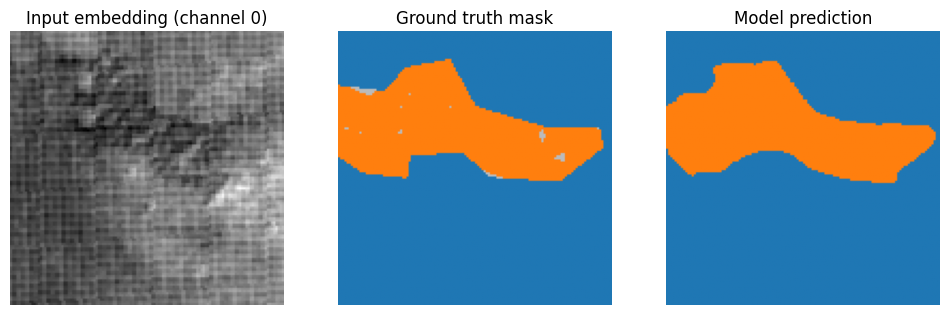

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


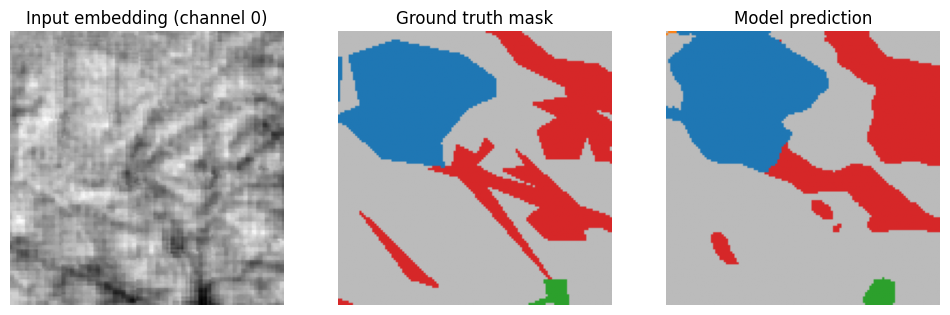

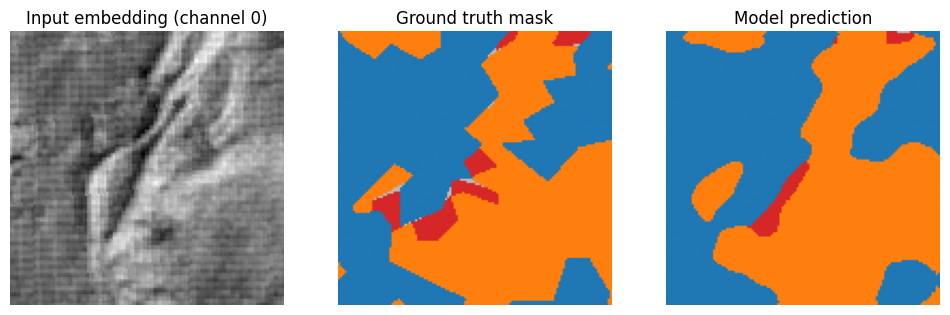

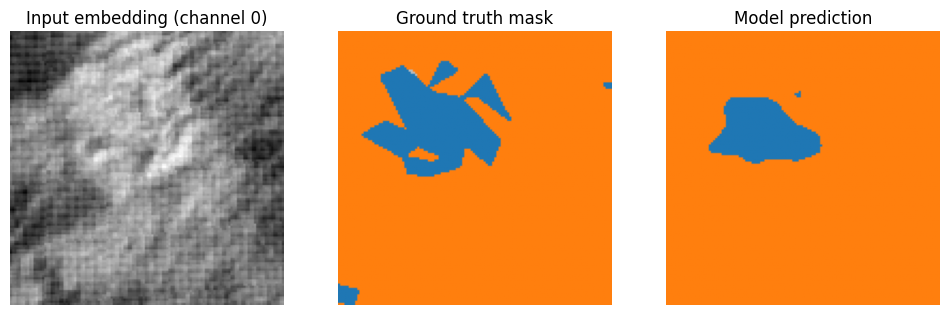

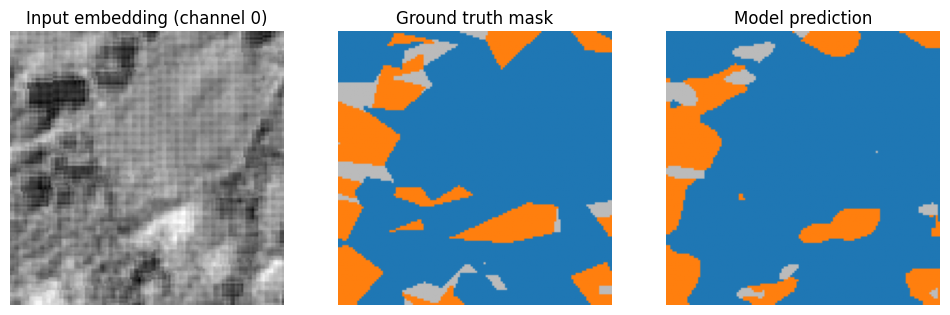

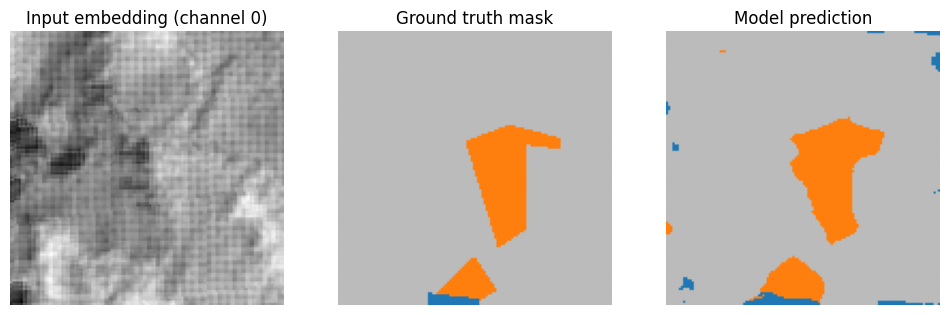

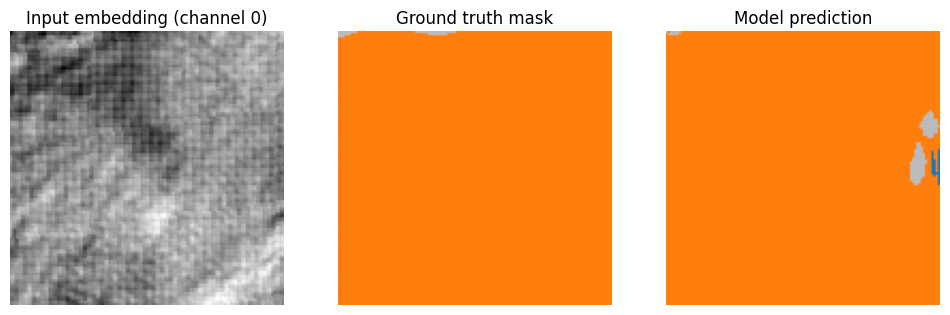

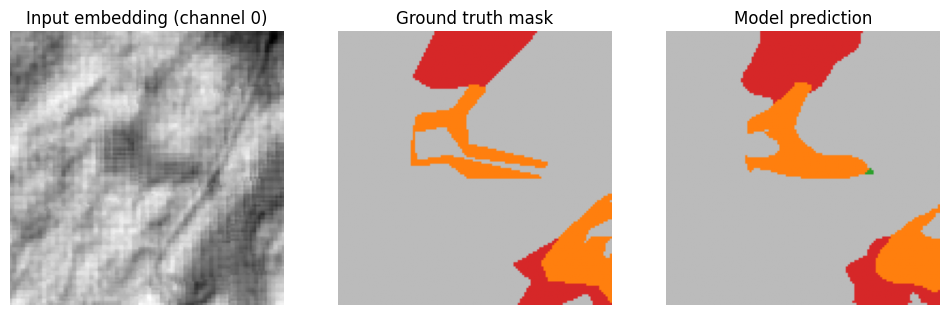

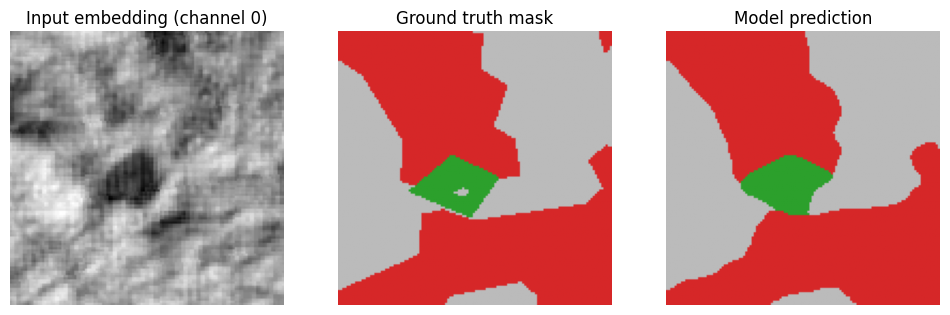

In [ ]:

import matplotlib.colors as mcolors

# Define colors for wetland classes (0-4) and gray for the rest
wetland_colors = [
    "#1f77b4",  # class 0
    "#ff7f0e",  # class 1
    "#2ca02c",  # class 2
    "#d62728",  # class 3
    "#9467bd",  # class 4
]
# All other classes -> light gray
gray_color = "#bbbbbb"

# Create a color map for all NUM_CLASSES
cmap_list = wetland_colors + [gray_color]*(NUM_CLASSES - 5)
cmap = mcolors.ListedColormap(cmap_list)

# Optional: define bounds and norm to align integer labels to colors
bounds = list(range(NUM_CLASSES+1))
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Show predictions
num_batches_to_show = 10
for imgs, masks in val_ds.take(num_batches_to_show):
    preds = model.predict(imgs)
    preds_labels = np.argmax(preds, axis=-1)

    n = imgs.shape[0]
    for i in range(n):
        plt.figure(figsize=(12,4))

        plt.subplot(1,3,1)
        plt.imshow(imgs[i,:,:,0], cmap='gray')
        plt.title("Input embedding (channel 0)")
        plt.axis('off')

        plt.subplot(1,3,2)
        plt.imshow(masks[i], cmap=cmap, norm=norm)
        plt.title("Ground truth mask")
        plt.axis('off')

        plt.subplot(1,3,3)
        plt.imshow(preds_labels[i], cmap=cmap, norm=norm)
        plt.title("Model prediction")
        plt.axis('off')

        plt.show()


In [ ]:
!gsutil cp /content/segmentation_model.keras gs://saadwetlands-bucket/perfection/

Copying file:///content/segmentation_model.keras [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/359.9 MiB.                                    
